In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
# from ydata_profiling import ProfileReport

import plotly.subplots as sp
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import itertools

from sklearn.preprocessing import LabelEncoder, StandardScaler


from itertools import combinations
from scipy.stats import pearsonr


In [2]:
import plotly.io as pio
pio.renderers.default = "notebook"

Loading the dataset

In [3]:
# Load the dataset

url = r'/kaggle/input/students-grading-dataset/Students_Grading_Dataset.csv'
df_student = pd.read_csv(url,sep=',',encoding='utf-8')


In [4]:
# Profile the dataset
# profile = ProfileReport(df_student, title='Pandas Profile', minimal=True, progress_bar=False)
# profile.to_notebook_iframe()

In [5]:
print("Shape of the dataset:")
df_student.shape

Shape of the dataset:


(5000, 23)

In [6]:
print("Columns of the dataset:")
df_student.columns

Columns of the dataset:


Index(['Student_ID', 'First_Name', 'Last_Name', 'Email', 'Gender', 'Age',
       'Department', 'Attendance (%)', 'Midterm_Score', 'Final_Score',
       'Assignments_Avg', 'Quizzes_Avg', 'Participation_Score',
       'Projects_Score', 'Total_Score', 'Grade', 'Study_Hours_per_Week',
       'Extracurricular_Activities', 'Internet_Access_at_Home',
       'Parent_Education_Level', 'Family_Income_Level', 'Stress_Level (1-10)',
       'Sleep_Hours_per_Night'],
      dtype='object')

In [7]:
# print("Number of students in everey department:")
# df_student["Parent_Education_Level"].value_counts()

In [8]:
print("some statistical summary of the dataset:")
df_student.describe()

some statistical summary of the dataset:


,Age,Attendance (%),Midterm_Score,Final_Score,Assignments_Avg,Quizzes_Avg,Participation_Score,Projects_Score,Total_Score,Study_Hours_per_Week,Stress_Level (1-10),Sleep_Hours_per_Night
count,5000.000000,4484.000000,5000.000000,5000.000000,4483.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.00000,5000.000000
mean,21.048400,75.431409,70.326844,69.640788,74.798673,74.910728,4.980024,74.924860,75.121804,17.658860,5.48080,6.488140
std,1.989786,14.372446,17.213209,17.238744,14.411799,14.504281,2.890136,14.423415,14.399941,7.275864,2.86155,1.452283
min,18.000000,50.010000,40.000000,40.000000,50.000000,50.030000,0.000000,50.010000,50.020000,5.000000,1.00000,4.000000
25%,19.000000,63.265000,55.457500,54.667500,62.090000,62.490000,2.440000,62.320000,62.835000,11.400000,3.00000,5.200000
50%,21.000000,75.725000,70.510000,69.735000,74.810000,74.695000,4.955000,74.980000,75.395000,17.500000,5.00000,6.500000
75%,23.000000,87.472500,84.970000,84.500000,86.970000,87.630000,7.500000,87.367500,87.652500,24.100000,8.00000,7.700000
max,24.000000,100.000000,99.980000,99.980000,99.980000,99.960000,10.000000,100.000000,99.990000,30.000000,10.00000,9.000000


In [9]:
print("some of information about the dataset:")
df_student.info()

some of information about the dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 23 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Student_ID                  5000 non-null   object 
 1   First_Name                  5000 non-null   object 
 2   Last_Name                   5000 non-null   object 
 3   Email                       5000 non-null   object 
 4   Gender                      5000 non-null   object 
 5   Age                         5000 non-null   int64  
 6   Department                  5000 non-null   object 
 7   Attendance (%)              4484 non-null   float64
 8   Midterm_Score               5000 non-null   float64
 9   Final_Score                 5000 non-null   float64
 10  Assignments_Avg             4483 non-null   float64
 11  Quizzes_Avg                 5000 non-null   float64
 12  Participation_Score         5000 non-null   float64

In [10]:
print("Data types of the dataset:")
df_student.dtypes

Data types of the dataset:


Student_ID                     object
First_Name                     object
Last_Name                      object
Email                          object
Gender                         object
Age                             int64
Department                     object
Attendance (%)                float64
Midterm_Score                 float64
Final_Score                   float64
Assignments_Avg               float64
Quizzes_Avg                   float64
Participation_Score           float64
Projects_Score                float64
Total_Score                   float64
Grade                          object
Study_Hours_per_Week          float64
Extracurricular_Activities     object
Internet_Access_at_Home        object
Parent_Education_Level         object
Family_Income_Level            object
Stress_Level (1-10)             int64
Sleep_Hours_per_Night         float64
dtype: object

In [11]:
print ("Missing values in the dataset:")
df_student.isnull().sum()

Missing values in the dataset:


Student_ID                       0
First_Name                       0
Last_Name                        0
Email                            0
Gender                           0
Age                              0
Department                       0
Attendance (%)                 516
Midterm_Score                    0
Final_Score                      0
Assignments_Avg                517
Quizzes_Avg                      0
Participation_Score              0
Projects_Score                   0
Total_Score                      0
Grade                            0
Study_Hours_per_Week             0
Extracurricular_Activities       0
Internet_Access_at_Home          0
Parent_Education_Level        1794
Family_Income_Level              0
Stress_Level (1-10)              0
Sleep_Hours_per_Night            0
dtype: int64

In [12]:
print("Unique values in the dataset:")
df_student.nunique()

Unique values in the dataset:


Student_ID                    5000
First_Name                       8
Last_Name                        6
Email                         5000
Gender                           2
Age                              7
Department                       4
Attendance (%)                2980
Midterm_Score                 3409
Final_Score                   3371
Assignments_Avg               2993
Quizzes_Avg                   3173
Participation_Score            997
Projects_Score                3141
Total_Score                   3171
Grade                            5
Study_Hours_per_Week           251
Extracurricular_Activities       2
Internet_Access_at_Home          2
Parent_Education_Level           4
Family_Income_Level              3
Stress_Level (1-10)             10
Sleep_Hours_per_Night           51
dtype: int64

In [13]:
print("First 5 rows of the dataset:")
df_student.head(5)

First 5 rows of the dataset:


,Student_ID,First_Name,Last_Name,Email,Gender,Age,Department,Attendance (%),Midterm_Score,Final_Score,...,Projects_Score,Total_Score,Grade,Study_Hours_per_Week,Extracurricular_Activities,Internet_Access_at_Home,Parent_Education_Level,Family_Income_Level,Stress_Level (1-10),Sleep_Hours_per_Night
0,S1000,Omar,Williams,student0@university.com,Female,22,Engineering,52.29,55.03,57.82,...,85.90,56.09,F,6.2,No,Yes,High School,Medium,5,4.7
1,S1001,Maria,Brown,student1@university.com,Male,18,Engineering,97.27,97.23,45.80,...,55.65,50.64,A,19.0,No,Yes,NaN,Medium,4,9.0
2,S1002,Ahmed,Jones,student2@university.com,Male,24,Business,57.19,67.05,93.68,...,73.79,70.30,D,20.7,No,Yes,Master's,Low,6,6.2
3,S1003,Omar,Williams,student3@university.com,Female,24,Mathematics,95.15,47.79,80.63,...,92.12,61.63,A,24.8,Yes,Yes,High School,High,3,6.7
4,S1004,John,Smith,student4@university.com,Female,23,CS,54.18,46.59,78.89,...,68.42,66.13,F,15.4,Yes,Yes,High School,High,2,7.1


In [14]:
print("Correlation matrix of the dataset:") 
df_student.select_dtypes(include=['number']).corr()

Correlation matrix of the dataset:


,Age,Attendance (%),Midterm_Score,Final_Score,Assignments_Avg,Quizzes_Avg,Participation_Score,Projects_Score,Total_Score,Study_Hours_per_Week,Stress_Level (1-10),Sleep_Hours_per_Night
Age,1.000000,0.009514,0.006502,-0.016180,-0.033268,0.007839,-0.014129,0.002401,0.017413,0.001547,-0.004474,-0.005090
Attendance (%),0.009514,1.000000,-0.007588,-0.025424,-0.037872,-0.029042,-0.029839,-0.013337,-0.019524,0.016311,0.012161,-0.036312
Midterm_Score,0.006502,-0.007588,1.000000,0.000841,-0.007364,-0.011235,-0.000836,0.014015,-0.001225,0.002456,0.020020,-0.003724
Final_Score,-0.016180,-0.025424,0.000841,1.000000,0.010692,0.003528,0.014494,-0.003148,0.006597,0.009137,-0.000450,-0.014106
Assignments_Avg,-0.033268,-0.037872,-0.007364,0.010692,1.000000,0.007264,0.013872,0.007013,0.000588,0.023342,0.011542,0.018564
Quizzes_Avg,0.007839,-0.029042,-0.011235,0.003528,0.007264,1.000000,-0.005416,0.005051,0.013963,0.020306,0.001508,0.002286
Participation_Score,-0.014129,-0.029839,-0.000836,0.014494,0.013872,-0.005416,1.000000,-0.025893,-0.034289,-0.004495,-0.006081,-0.006416
Projects_Score,0.002401,-0.013337,0.014015,-0.003148,0.007013,0.005051,-0.025893,1.000000,-0.018489,0.004134,-0.015188,-0.003537
Total_Score,0.017413,-0.019524,-0.001225,0.006597,0.000588,0.013963,-0.034289,-0.018489,1.000000,-0.012744,0.004217,0.002037
Study_Hours_per_Week,0.001547,0.016311,0.002456,0.009137,0.023342,0.020306,-0.004495,0.004134,-0.012744,1.000000,0.004551,-0.003365


Data Cleaning

In [15]:
print("Missing values in the dataset before laplace missing values by (mean, mode):")
df_student.isnull().sum()

Missing values in the dataset before laplace missing values by (mean, mode):


Student_ID                       0
First_Name                       0
Last_Name                        0
Email                            0
Gender                           0
Age                              0
Department                       0
Attendance (%)                 516
Midterm_Score                    0
Final_Score                      0
Assignments_Avg                517
Quizzes_Avg                      0
Participation_Score              0
Projects_Score                   0
Total_Score                      0
Grade                            0
Study_Hours_per_Week             0
Extracurricular_Activities       0
Internet_Access_at_Home          0
Parent_Education_Level        1794
Family_Income_Level              0
Stress_Level (1-10)              0
Sleep_Hours_per_Night            0
dtype: int64

In [16]:
# - Numerical features: Fill missing values with the column mean.
df_student.fillna(df_student.mean(numeric_only=True), inplace=True)

# - Categorical features: Fill missing values with the mode
df_student.fillna(df_student.mode().iloc[0], inplace=True)

In [17]:
print("Missing values in the dataset after laplace missing values by (mean, mode):")
df_student.isnull().sum()

Missing values in the dataset after laplace missing values by (mean, mode):


Student_ID                    0
First_Name                    0
Last_Name                     0
Email                         0
Gender                        0
Age                           0
Department                    0
Attendance (%)                0
Midterm_Score                 0
Final_Score                   0
Assignments_Avg               0
Quizzes_Avg                   0
Participation_Score           0
Projects_Score                0
Total_Score                   0
Grade                         0
Study_Hours_per_Week          0
Extracurricular_Activities    0
Internet_Access_at_Home       0
Parent_Education_Level        0
Family_Income_Level           0
Stress_Level (1-10)           0
Sleep_Hours_per_Night         0
dtype: int64

In [18]:
## Handling duplicate values

print("Number of duplicate IDs in the dataset:")
duplicate_ids = df_student["Student_ID"].duplicated().sum()
print(duplicate_ids)

df_student.drop_duplicates(subset=["Student_ID"], inplace=True)
print("Number of duplicate IDs in the dataset after removing them:")
df_student["Student_ID"].duplicated().sum()

Number of duplicate IDs in the dataset:
0
Number of duplicate IDs in the dataset after removing them:


0

In [19]:
# Drop unnecessary columns 
# df_student = df_student.drop(columns=['Student_ID', 'Email', 'First_Name', 'Last_Name'])

Identify correlations and patterns in student performance. 

Compute the correlation matrix for numerical columns, filter values greater than 0.5 (excluding self-correlations), and save the results.

In [20]:
def correlation_matrix(df):
    plt.figure(figsize=(12, 6))
    
    # Compute the correlation matrix for numerical columns only
    df_corr = df.select_dtypes(include=['number']).corr()
    
    # Plot the heatmap
    sns.heatmap(df_corr, annot=True, cmap="coolwarm", fmt=".2f")
    plt.title("Correlation Matrix")
    plt.show()
    
    # Extract values greater than 0.5 (excluding the diagonal)
    correlated_pairs = []
    for i in range(len(df_corr.columns)):
        for j in range(i + 1, len(df_corr.columns)):  # Avoid duplicate pairs and diagonal values
            if abs(df_corr.iloc[i, j]) >= 0.49:
                correlated_pairs.append((df_corr.index[i], df_corr.columns[j], df_corr.iloc[i, j]))
    
    # Convert the result into a DataFrame
    correlated_df = pd.DataFrame(correlated_pairs, columns=["Column_1", "Column_2", "Correlation"])
    
    return correlated_df

Correlation Matrix Before Encoding

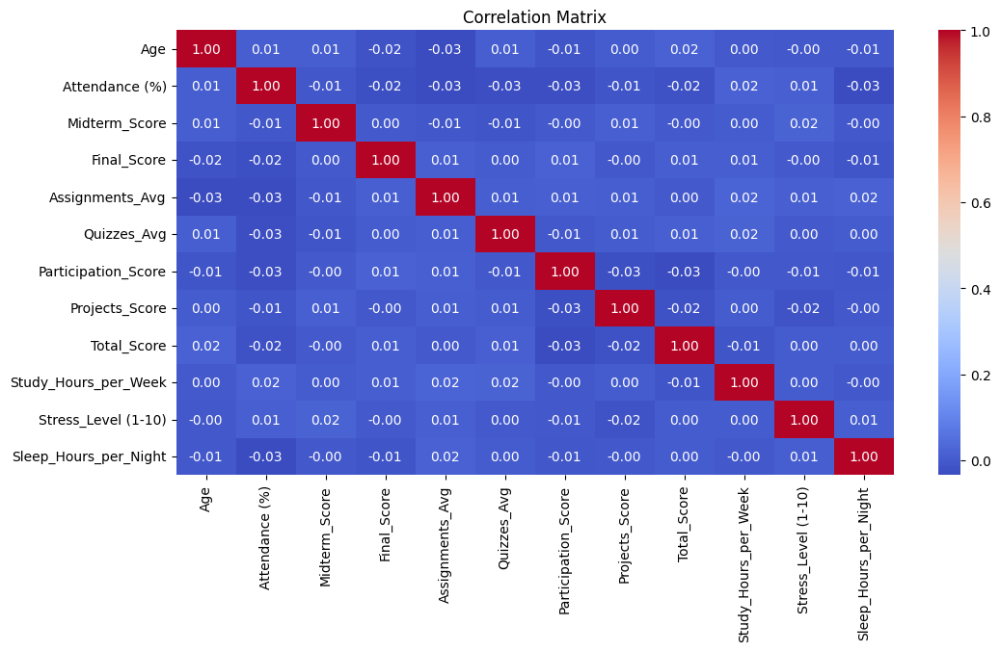

,Column_1,Column_2,Correlation


In [21]:
correlation_matrix(df_student)

Encoding categorical variables using Label Encoding.

In [22]:
# df_student_2 it is a copy (encoding dataset)
df_student_2=df_student.copy()

categorical_cols = ['Gender', 'Department', 'Extracurricular_Activities', 'Internet_Access_at_Home',
                    'Parent_Education_Level', 'Family_Income_Level', 'Grade']
label_encoders = {col: LabelEncoder().fit(df_student_2[col]) for col in categorical_cols}
for col, le in label_encoders.items():
    df_student_2[col] = le.transform(df_student_2[col])

Correlation Matrix After Encoding

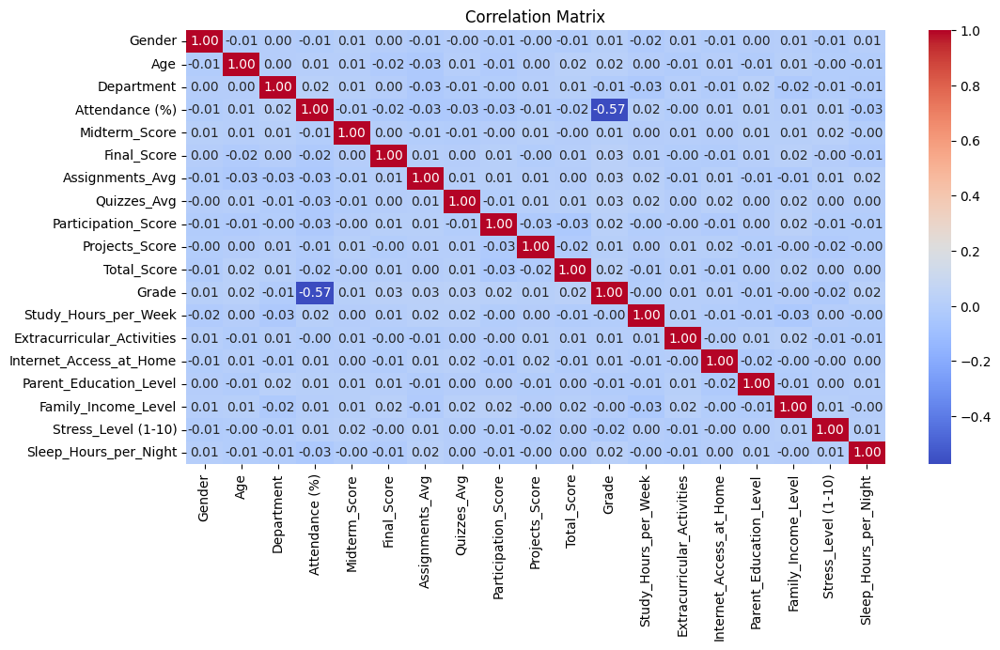

,Column_1,Column_2,Correlation
0,Attendance (%),Grade,-0.572927


In [23]:
correlation_matrix(df_student_2)

In [24]:
df_student.groupby("Grade")["Total_Score"].describe()

,count,mean,std,min,25%,50%,75%,max
Grade,,,,,,,,
A,1495.0,74.435592,14.035800,50.02,62.5650,74.500,86.0900,99.99
B,978.0,75.017638,14.257176,50.05,63.0325,74.940,87.4700,99.99
C,794.0,76.089899,14.775379,50.08,63.2075,77.870,88.7300,99.98
D,889.0,75.535388,14.555005,50.03,63.6600,75.090,88.6400,99.94
F,844.0,75.111635,14.645493,50.06,61.9300,76.215,87.6375,99.98


In [25]:
# df_student_2 it is a copy (encoding dataset)
df_student_2_new_column_added_Grade=df_student.copy()


# Create a new column 'Total_Score_Normalized'
# Add a new column 'Total_Score_Normalized'
df_student_2_new_column_added_Grade["New_Total_Score"] = ((
    df_student_2_new_column_added_Grade["Midterm_Score"] +
    df_student_2_new_column_added_Grade["Final_Score"] +
    df_student_2_new_column_added_Grade["Assignments_Avg"] +
    df_student_2_new_column_added_Grade["Quizzes_Avg"] +
    df_student_2_new_column_added_Grade["Participation_Score"] +
    df_student_2_new_column_added_Grade["Projects_Score"]
) / 510)*100

# Add a 'Grade' column based on the normalized score
def assign_grade(score):
    if score >= 85:
        return "A"
    elif score >= 75:
        return "B"
    elif score >= 65:
        return "C"
    elif score >= 55:
        return "D"
    else:
        return "F"


df_student_2_new_column_added_Grade["New_Grade"] = df_student_2_new_column_added_Grade["New_Total_Score"].apply(assign_grade)

# Drop unnecessary columns 
df_student_2_new_column_added_Grade = df_student_2_new_column_added_Grade.drop(columns=['Grade', 'Total_Score'])

df_student_2_new_column_added_Grade.head()

,Student_ID,First_Name,Last_Name,Email,Gender,Age,Department,Attendance (%),Midterm_Score,Final_Score,...,Projects_Score,Study_Hours_per_Week,Extracurricular_Activities,Internet_Access_at_Home,Parent_Education_Level,Family_Income_Level,Stress_Level (1-10),Sleep_Hours_per_Night,New_Total_Score,New_Grade
0,S1000,Omar,Williams,student0@university.com,Female,22,Engineering,52.29,55.03,57.82,...,85.90,6.2,No,Yes,High School,Medium,5,4.7,70.788235,C
1,S1001,Maria,Brown,student1@university.com,Male,18,Engineering,97.27,97.23,45.80,...,55.65,19.0,No,Yes,PhD,Medium,4,9.0,73.733073,C
2,S1002,Ahmed,Jones,student2@university.com,Male,24,Business,57.19,67.05,93.68,...,73.79,20.7,No,Yes,Master's,Low,6,6.2,77.052941,B
3,S1003,Omar,Williams,student3@university.com,Female,24,Mathematics,95.15,47.79,80.63,...,92.12,24.8,Yes,Yes,High School,High,3,6.7,75.813725,B
4,S1004,John,Smith,student4@university.com,Female,23,CS,54.18,46.59,78.89,...,68.42,15.4,Yes,Yes,High School,High,2,7.1,74.592157,C


In [26]:
# print("Number of students in everey Grade:")
# df_student_2_new_column_added_Grade["New_Grade"].value_counts()

Encoding categorical variables using Label Encoding.

In [27]:
# Make a copy of the dataset
df_student_2_last_copy = df_student_2_new_column_added_Grade.copy()

# Define categorical columns
categorical_cols = ['Gender', 'Department', 'Extracurricular_Activities', 'Internet_Access_at_Home',
                    'Parent_Education_Level', 'Family_Income_Level', "New_Grade"]

# Dictionary to store label encoders
label_encoders = {}

for col in categorical_cols:
    le = LabelEncoder()  # Initialize LabelEncoder
    
    if col in ['Family_Income_Level', 'New_Grade']:
        # Reverse encoding: higher logical values get larger numbers
        encoded_values = le.fit_transform(df_student_2_new_column_added_Grade[col])
        reversed_mapping = dict(zip(le.classes_, reversed(range(len(le.classes_)))))
        df_student_2_new_column_added_Grade[col] = df_student_2_new_column_added_Grade[col].map(reversed_mapping)
        label_encoders[col] = reversed_mapping  # Store reversed mapping
    else:
        # Normal encoding for other categorical columns
        df_student_2_new_column_added_Grade[col] = le.fit_transform(df_student_2_new_column_added_Grade[col])
        label_encoders[col] = dict(zip(le.classes_, le.transform(le.classes_)))  # Store normal mapping

# Print encoded mappings
for col, mapping in label_encoders.items():
    if col in categorical_cols:  
        print(f"Column: {col}")
        for original, encoded in mapping.items():
            print(f"{original} -> {encoded}")
        print("-" * 30)


Column: Gender
Female -> 0
Male -> 1
------------------------------
Column: Department
Business -> 0
CS -> 1
Engineering -> 2
Mathematics -> 3
------------------------------
Column: Extracurricular_Activities
No -> 0
Yes -> 1
------------------------------
Column: Internet_Access_at_Home
No -> 0
Yes -> 1
------------------------------
Column: Parent_Education_Level
Bachelor's -> 0
High School -> 1
Master's -> 2
PhD -> 3
------------------------------
Column: Family_Income_Level
High -> 2
Low -> 1
Medium -> 0
------------------------------
Column: New_Grade
A -> 4
B -> 3
C -> 2
D -> 1
F -> 0
------------------------------


Correlation Matrix After Encoding and update columns{Grade, Total_Score}

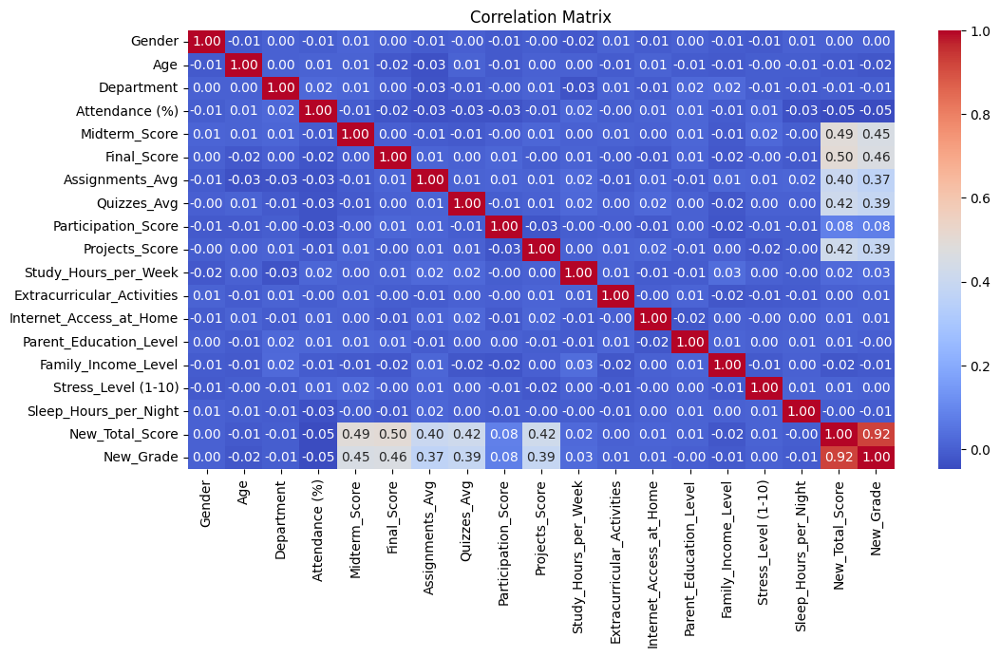

,Column_1,Column_2,Correlation
0,Midterm_Score,New_Total_Score,0.492119
1,Final_Score,New_Total_Score,0.499842
2,New_Total_Score,New_Grade,0.923715


In [28]:
high_correlation_df=correlation_matrix(df_student_2_new_column_added_Grade)
high_correlation_df

Feature engineering

In [29]:
# Create new interaction features
df_student_2_new_column_added_Grade['Study_Attendance_Impact'] = df_student_2_new_column_added_Grade['Study_Hours_per_Week'] * df_student_2_new_column_added_Grade['Attendance (%)']
df_student_2_new_column_added_Grade['Total_Continuous_Performance'] = (df_student_2_new_column_added_Grade['Assignments_Avg'] + 
                                                df_student_2_new_column_added_Grade['Quizzes_Avg'] + 
                                                df_student_2_new_column_added_Grade['Participation_Score'])
df_student_2_new_column_added_Grade['Sleep_Stress_Ratio'] = df_student_2_new_column_added_Grade['Stress_Level (1-10)'] / df_student_2_new_column_added_Grade['Sleep_Hours_per_Night']

# Display the first few rows to verify
print(df_student_2_new_column_added_Grade[['Study_Attendance_Impact', 'Total_Continuous_Performance', 'Sleep_Stress_Ratio']].head())

   Study_Attendance_Impact  Total_Continuous_Performance  Sleep_Stress_Ratio
0                  324.198                    162.270000            1.063830
1                 1848.130                    177.358673            0.444444
2                 1183.833                    158.450000            0.967742
3                 2359.720                    166.110000            0.447761
4                  834.372                    186.520000            0.281690


Correlation Matrix After adding feature engneeing and Encoding and update columns{Grade, Total_Score}

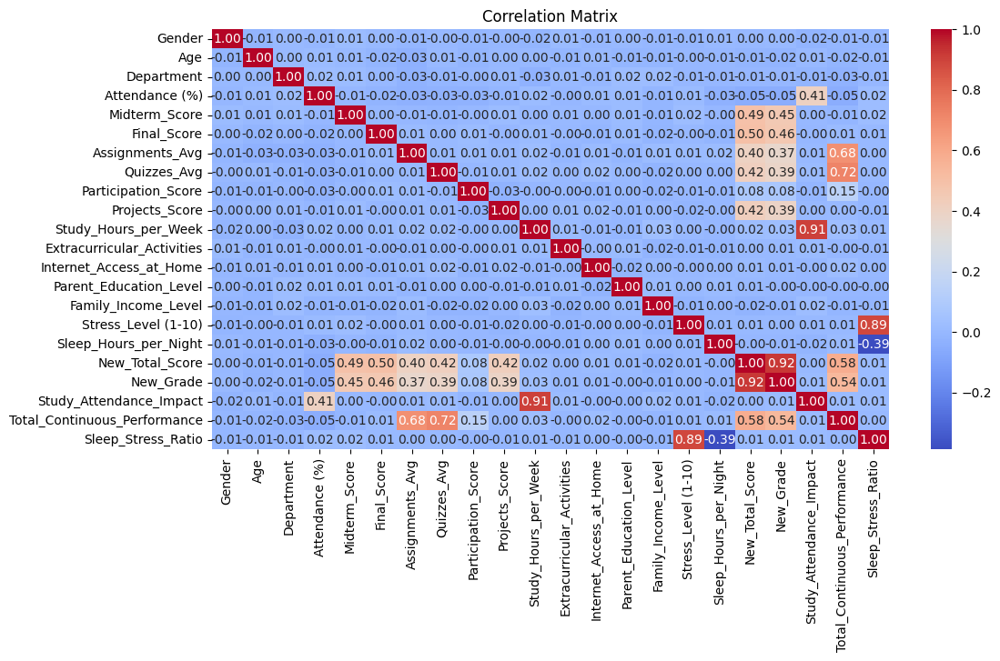

,Column_1,Column_2,Correlation
0,Midterm_Score,New_Total_Score,0.492119
1,Final_Score,New_Total_Score,0.499842
2,Assignments_Avg,Total_Continuous_Performance,0.682189
3,Quizzes_Avg,Total_Continuous_Performance,0.721707
4,Study_Hours_per_Week,Study_Attendance_Impact,0.905090
5,Stress_Level (1-10),Sleep_Stress_Ratio,0.890099
6,New_Total_Score,New_Grade,0.923715
7,New_Total_Score,Total_Continuous_Performance,0.580243
8,New_Grade,Total_Continuous_Performance,0.536610


In [30]:
high_correlation_df=correlation_matrix(df_student_2_new_column_added_Grade)
high_correlation_df

Exploring Relationships Between Numerical Variables

In [31]:
def plot_numeric_relationships_interactive(df, correlated_df,title=None):

    # Determine the number of plots based on the correlated column pairs
    num_plots = len(correlated_df)
    
    # Define the number of columns (2 plots per row)
    num_cols = 2
    num_rows = (num_plots // num_cols) + (num_plots % num_cols > 0)

    # Create a subplot grid layout
    fig = make_subplots(
        rows=num_rows, cols=num_cols, 
        subplot_titles=[f"{row['Column_1']} vs {row['Column_2']}" for _, row in correlated_df.iterrows()]
    )
    
    # Add scatter plots for each correlated column pair
    for index, (col_x, col_y, _) in enumerate(correlated_df.itertuples(index=False, name=None)):
        row = (index // num_cols) + 1  # Compute row index
        col = (index % num_cols) + 1   # Compute column index

        # Create a scatter plot with trendline
        scatter = px.scatter(
            df, 
            x=col_x, 
            y=col_y, 
            trendline="ols",  # Add a regression trendline
            opacity=0.7,  # Set transparency for better visibility
            color=df[col_x],  # Color points based on x-axis values
            color_continuous_scale="Viridis"  # Apply a color theme
        )

        # Add traces to the subplot grid
        for trace in scatter.data:
            fig.add_trace(trace, row=row, col=col)

    # Update layout settings
    fig.update_layout(
        height=num_rows * 400,  # Adjust the height for better readability
        width=1000,  # Set a fixed width
        showlegend=False,  # Hide the legend to avoid redundancy
        title_text=title
    )

    # Show the final interactive plot
    fig.show(renderer="notebook")

# Example usage:
# correlated_df = correlation_matrix(df)
# plot_numeric_relationships_interactive(df, correlated_df)


The most important relationships between features in a dataset depend on the correlation matrix

In [ ]:
plot_numeric_relationships_interactive(df_student_2_new_column_added_Grade, high_correlation_df,"All Correlation Plots (Pairs with Correlation > 0.5)")    

Box Plot: Visualizing Relationships Between Two Variables

In [33]:
def plot_Variables_relationship(df, x_columns, y_columns):
    # Ensure x_columns and y_columns are of the same length
    pairs = [(x, y) for x in x_columns for y in y_columns]
    
    # Define the number of columns per row (2 charts per row)
    num_cols = 3
    num_rows = (len(pairs) // num_cols) + (len(pairs) % num_cols > 0)
    
    # Create subplots
    fig = make_subplots(rows=num_rows, cols=num_cols, subplot_titles=[
        f"{x} vs {y}" for x, y in pairs
    ])

    # Add box plots
    for index, (x_col, y_col) in enumerate(pairs):
        row = (index // num_cols) + 1  # Row index
        col = (index % num_cols) + 1   # Column index
        
        # Create individual box plot
        box_plot = px.box(df, x=x_col, y=y_col, color=x_col)
        
        # Add traces to the subplot grid
        for trace in box_plot.data:
            fig.add_trace(trace, row=row, col=col)

    # Update layout
    fig.update_layout(
        height=num_rows * 200,
        width=1200,
        showlegend=False,
        title_text="Box Plots of Relationships (3 per row)"
    )

    # Show the plot
    fig.show()


In [34]:
# Example Usage
# Done
x=['New_Grade', 'Gender', 'Department', 'Extracurricular_Activities', 'Internet_Access_at_Home',
       'Parent_Education_Level', 'Family_Income_Level']

y=['Age', 'New_Total_Score','Sleep_Stress_Ratio','Total_Continuous_Performance','Study_Attendance_Impact']

plot_Variables_relationship(df_student_2_new_column_added_Grade, x, y)

Conducting exploratory data analysis (EDA) using visualizations.  

Interactive Pie Chart Counting  

In [35]:
def interactive_pie_chart(df, column_name, title="Interactive Pie Chart Counting"):
    
    # Count occurrences of each category in the column
    value_counts = df[column_name].value_counts().reset_index()
    value_counts.columns = [column_name, "Count"]

    # Identify the category with the highest count
    max_category = value_counts.loc[value_counts["Count"].idxmax(), column_name]

    # Create an interactive Pie Chart
    fig = px.pie(
        value_counts, 
        names=column_name, 
        values="Count",
        title=title,
        color=column_name,
        color_discrete_map={max_category: "red"}  # Highlight the highest category in red
    )

    # Create a "pull" effect for the largest category
    pull_values = [0.1 if category == max_category else 0 for category in value_counts[column_name]]
    fig.update_traces(pull=pull_values)

    # Show the chart
    fig.show()

In [36]:
# Done
interactive_pie_chart(df_student_2_last_copy, "Department", "Interactive Department Counting")
interactive_pie_chart(df_student_2_last_copy, "New_Grade", "Interactive Grade Counting")
interactive_pie_chart(df_student_2_last_copy, "Gender", "Interactive Gender Counting")
interactive_pie_chart(df_student_2_last_copy, "Stress_Level (1-10)", "Interactive Stress_Level (1-10) Counting")
interactive_pie_chart(df_student_2_last_copy, "Family_Income_Level", "Interactive Family_Income_Level	 Counting")
interactive_pie_chart(df_student_2_last_copy, "Parent_Education_Level", "Interactive Parent_Education_Level Counting")
interactive_pie_chart(df_student_2_last_copy, "Internet_Access_at_Home", "Interactive Internet_Access_at_Home Counting")
interactive_pie_chart(df_student_2_last_copy, "Extracurricular_Activities", "Interactive Extracurricular_Activities Counting")

(Gender & Grade) Counting Distribution Histogram

In [37]:
def plot_age_distribution(df, column_name,column_color):
    fig = px.histogram(df, 
                       x=column_name, 
                       nbins=20, 
                       title=f"{column_name} Counting by {column_color}", 
                       color=column_color)
    fig.show()

In [38]:
# Done
plot_age_distribution(df_student_2_last_copy, "Age", "New_Grade")
plot_age_distribution(df_student_2_last_copy, "Department", "New_Grade")
plot_age_distribution(df_student_2_last_copy, "Internet_Access_at_Home", "New_Grade")
plot_age_distribution(df_student_2_last_copy, "Extracurricular_Activities", "New_Grade")
plot_age_distribution(df_student_2_last_copy, "Parent_Education_Level", "New_Grade")
plot_age_distribution(df_student_2_last_copy, "Family_Income_Level", "New_Grade")
plot_age_distribution(df_student_2_last_copy, "Stress_Level (1-10)", "New_Grade")

In [39]:
# Done
plot_age_distribution(df_student_2_last_copy, "Age", "Gender")
plot_age_distribution(df_student_2_last_copy, "Department", "Gender")
plot_age_distribution(df_student_2_last_copy, "New_Grade", "Gender")
plot_age_distribution(df_student_2_last_copy, "Internet_Access_at_Home", "Gender")
plot_age_distribution(df_student_2_last_copy, "Extracurricular_Activities", "Gender")
plot_age_distribution(df_student_2_last_copy, "Parent_Education_Level", "Gender")
plot_age_distribution(df_student_2_last_copy, "Family_Income_Level", "Gender")
plot_age_distribution(df_student_2_last_copy, "Stress_Level (1-10)", "Gender")

Grade-Specific Category Distribution

In [40]:
def plot_specific_grade_distribution(df, grade_column, category_column, target_grade1, target_grade2):
    # Filter dataset for both grades
    filtered_df1 = df[df[grade_column] == target_grade1]
    filtered_df2 = df[df[grade_column] == target_grade2]
    
    # Count occurrences of each category for both grades
    grade_counts1 = filtered_df1[category_column].value_counts().reset_index()
    grade_counts1.columns = [category_column, "Count"]
    
    grade_counts2 = filtered_df2[category_column].value_counts().reset_index()
    grade_counts2.columns = [category_column, "Count"]
    
    # Create subplots
    fig = make_subplots(rows=1, cols=2, 
                        subplot_titles=[f"{category_column} Distribution for Grade {target_grade1}",
                                        f"{category_column} Distribution for Grade {target_grade2}"],
                        specs=[[{"type": "domain"}, {"type": "domain"}]])
    
    # Identify the most frequent category to highlight for both grades
    if not grade_counts1.empty:
        max_category1 = grade_counts1.loc[grade_counts1["Count"].idxmax(), category_column]
        pull_values1 = [0.1 if category == max_category1 else 0 for category in grade_counts1[category_column]]
        fig.add_trace(go.Pie(labels=grade_counts1[category_column], values=grade_counts1["Count"],
                              name=f"Grade {target_grade1}", pull=pull_values1),
                      row=1, col=1)
    
    if not grade_counts2.empty:
        max_category2 = grade_counts2.loc[grade_counts2["Count"].idxmax(), category_column]
        pull_values2 = [0.1 if category == max_category2 else 0 for category in grade_counts2[category_column]]
        fig.add_trace(go.Pie(labels=grade_counts2[category_column], values=grade_counts2["Count"],
                              name=f"Grade {target_grade2}", pull=pull_values2),
                      row=1, col=2)
    
    # Update layout
    fig.update_layout(title_text=f" Comparison of {category_column} Students with for Grades {target_grade1} and {target_grade2}")
    
    # Show the figure
    fig.show()

In [41]:
# Done
plot_specific_grade_distribution(df_student_2_last_copy, "New_Grade", "Stress_Level (1-10)", "A", "F")
plot_specific_grade_distribution(df_student_2_last_copy, "New_Grade", "Family_Income_Level", "A", "F")
plot_specific_grade_distribution(df_student_2_last_copy, "New_Grade", "Department", "A", "F")
plot_specific_grade_distribution(df_student_2_last_copy, "New_Grade", "Gender", "A", "F")
plot_specific_grade_distribution(df_student_2_last_copy, "New_Grade", "Extracurricular_Activities", "A", "F")
plot_specific_grade_distribution(df_student_2_last_copy, "New_Grade", "Parent_Education_Level", "A", "F")
plot_specific_grade_distribution(df_student_2_last_copy, "New_Grade", "Internet_Access_at_Home", "A", "F")


Enhanced Interactive Histogram with Box Plot to understanding of the column's distribution.

In [42]:
def interactive_histogram(df, column_name, bins=50):

    # Create an interactive histogram
    fig = px.histogram(
        df, 
        x=column_name, 
        nbins=bins, 
        title=f"Exploring {column_name} Variability with Interactive Histogram and Box Plot",
        color_discrete_sequence=["#636EFA"],  # Custom color
        marginal="box"  # Adds a box plot on top for better insights
    )
    
    # Customize layout
    fig.update_layout(
        xaxis_title=column_name,
        yaxis_title="Count",
        bargap=0.05  # Adjusts gap between bars
    )

    # Show the chart
    fig.show()

In [43]:
# Done
interactive_histogram(df_student_2_last_copy, "New_Total_Score",  bins=20)
interactive_histogram(df_student_2_last_copy, "Attendance (%)", bins=20)
interactive_histogram(df_student_2_last_copy, "Stress_Level (1-10)", bins=5)
interactive_histogram(df_student_2_last_copy, "Sleep_Hours_per_Night", bins=20)
interactive_histogram(df_student_2_last_copy, "Study_Hours_per_Week", bins=20)

interactive_histogram(df_student_2_last_copy, "Projects_Score", bins=20)
interactive_histogram(df_student_2_last_copy, "Final_Score", bins=20)
interactive_histogram(df_student_2_last_copy, "Midterm_Score", bins=20)
interactive_histogram(df_student_2_last_copy, "Age", bins=10)

Distribution Analysis of Numerical Features

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version

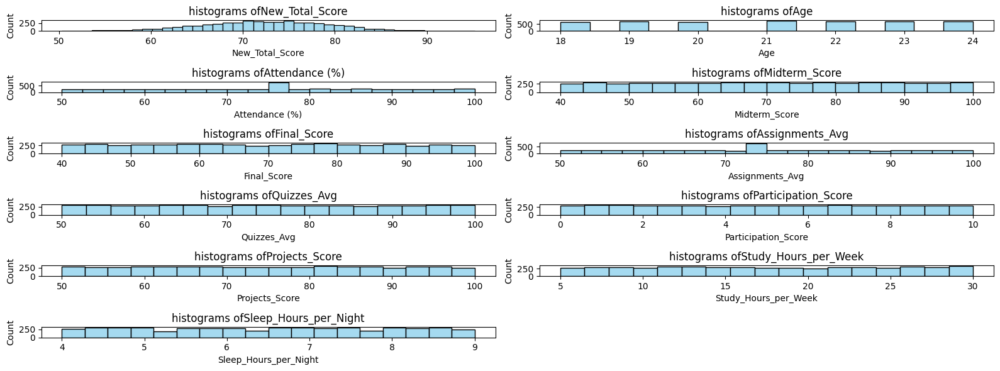

In [44]:
numerical_cols = ["New_Total_Score","Age", "Attendance (%)", "Midterm_Score", "Final_Score", "Assignments_Avg","Quizzes_Avg","Participation_Score","Projects_Score", "Study_Hours_per_Week", "Sleep_Hours_per_Night"]
plt.figure(figsize=(16, 6))

# histograms. for outlier detection
for i, col in enumerate(numerical_cols, 1):
    plt.subplot(6, 2, i)
    sns.histplot(x=df_student_2_new_column_added_Grade[col], color="skyblue")
    plt.title(f"histograms of{col}")

plt.tight_layout()
plt.show()

Outlier Detection Using Boxplots

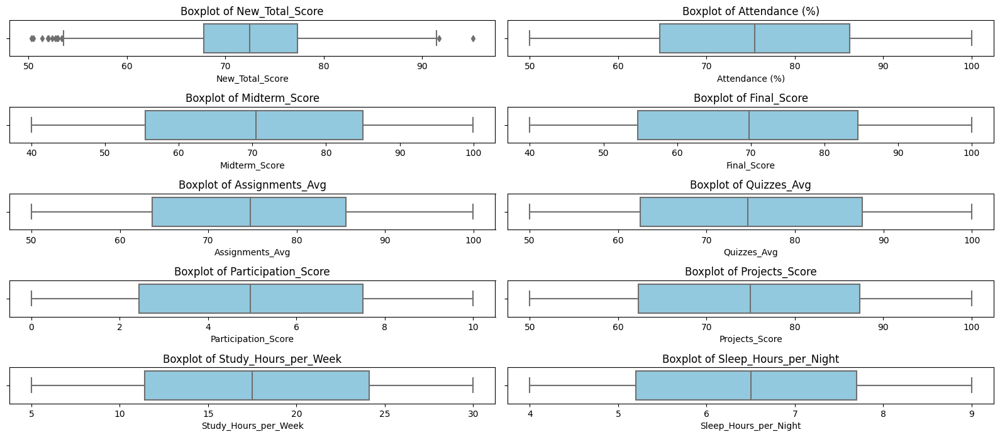

In [45]:
numerical_cols = ["New_Total_Score", "Attendance (%)", "Midterm_Score", "Final_Score", "Assignments_Avg","Quizzes_Avg","Participation_Score","Projects_Score", "Study_Hours_per_Week", "Sleep_Hours_per_Night"]
plt.figure(figsize=(16, 8))

# Boxplot for outlier detection
for i, col in enumerate(numerical_cols, 1):
    plt.subplot(6, 2, i)
    sns.boxplot(x=df_student_2_new_column_added_Grade[col], color="skyblue")
    plt.title(f"Boxplot of {col}")

plt.tight_layout()
plt.show()

Top Performing Students Visualization

In [46]:
def plot_top_students_by_score_grid(df, score_columns, top_n=3):

    num_plots = len(score_columns)
    num_cols = 2  # Two charts per row
    num_rows = (num_plots // num_cols) + (num_plots % num_cols > 0)

    # Create a subplot grid
    fig = make_subplots(
        rows=num_rows, cols=num_cols, 
        subplot_titles=[f"Top {top_n} Students by {col}" for col in score_columns]
    )

    # Loop through each score column and add a bar chart
    for index, score_column in enumerate(score_columns):
        row = (index // num_cols) + 1
        col = (index % num_cols) + 1
        
        # Sort students by score and get the top N
        top_students = df.sort_values(by=score_column, ascending=False).head(top_n)

        # Create the bar chart
        bar_chart = go.Bar(
            x=top_students["First_Name"],
            y=top_students[score_column],
            text=top_students.apply(lambda row: f"ID: {row['Student_ID']}<br>"
                                                f"Name: {row['First_Name']} {row['Last_Name']}<br>"
                                                f"Email: {row['Email']}", axis=1),
            textposition="outside",
            marker=dict(color=top_students[score_column], colorscale="Viridis"),
            name=f"Top {top_n} by {score_column}"
        )

        # Add the chart to the subplot
        fig.add_trace(bar_chart, row=row, col=col)

    # Update layout
    fig.update_layout(
        height=num_rows * 400,
        width=1000,
        showlegend=False,
        title_text="Top Students by Various Scores (2 Charts Per Row)"
    )

    # Display the plot
    fig.show()


In [47]:
# Done
score_columns = ["Assignments_Avg", "Quizzes_Avg", "Midterm_Score", "Projects_Score", "Final_Score","Participation_Score"]
plot_top_students_by_score_grid(df_student_2_last_copy, score_columns, top_n=3)

Grade Distribution Across Categories

In [48]:
def plot_grade_distribution_by_column(df, another_column):

    # Count the number of students for each grade within each unique value of the selected column
    grade_counts = df.groupby([another_column, "New_Grade"]).size().reset_index(name="Count")

    # Create an interactive stacked bar chart
    fig = px.bar(
        grade_counts, 
        x=another_column, 
        y="Count", 
        color="New_Grade",
        title=f"Comparing Grade Performance Based on {another_column}",
        barmode="group",  # Change to "stack" to see the cumulative percentage
        text="Count"
    )

    fig.update_traces(textposition="outside")  # Display values above bars
    fig.show()

In [49]:
## Done
plot_grade_distribution_by_column(df_student_2_last_copy, "Department")
plot_grade_distribution_by_column(df_student_2_last_copy, "Parent_Education_Level")
plot_grade_distribution_by_column(df_student_2_last_copy, "Family_Income_Level")
plot_grade_distribution_by_column(df_student_2_last_copy, "Gender")
plot_grade_distribution_by_column(df_student_2_last_copy, "Internet_Access_at_Home")
plot_grade_distribution_by_column(df_student_2_last_copy, "Extracurricular_Activities")
plot_grade_distribution_by_column(df_student_2_last_copy, "Stress_Level (1-10)")

Trend Analysis: Stress Levels & Sleep Hours by Age  

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



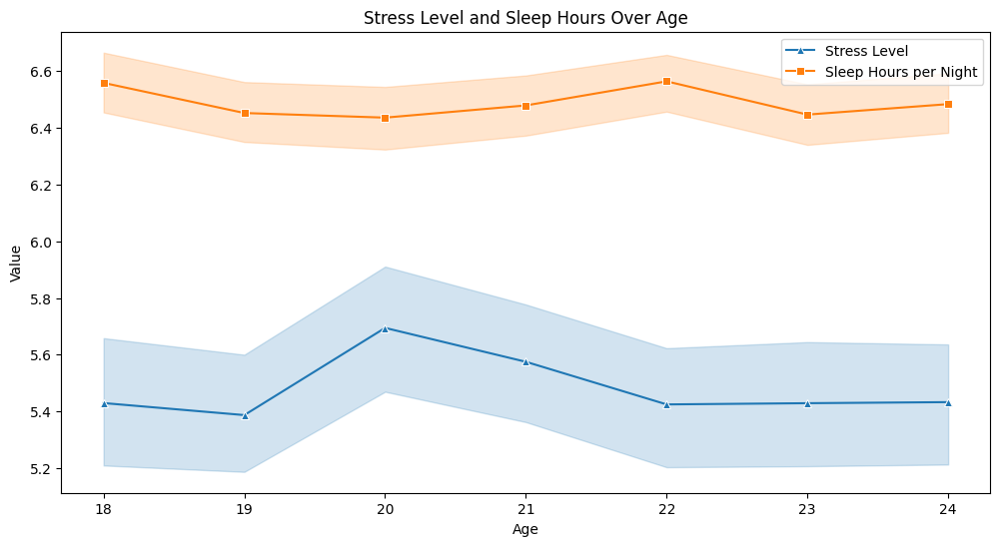

In [50]:
# Set figure size
plt.figure(figsize=(12, 6))

# Line plot for Stress Level (changed to blue)
sns.lineplot(x=df_student_2_last_copy['Age'], y=df_student_2_last_copy['Stress_Level (1-10)'], 
             label="Stress Level", marker='^', color='#1f77b4')  # Blue

# Line plot for Sleep Hours per Night (changed to orange)
sns.lineplot(x=df_student_2_last_copy['Age'], y=df_student_2_last_copy['Sleep_Hours_per_Night'], 
             label="Sleep Hours per Night", marker='s', color='#ff7f0e')  # Orange

# Labels and title
plt.xlabel("Age")
plt.ylabel("Value")
plt.title("Stress Level and Sleep Hours Over Age")
plt.legend()

# Show plot
plt.show()
